<a href="https://colab.research.google.com/github/toku-dango/kaggle_competition_sample/blob/main/note_eda_dl_titanic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Input Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
import os

!pwd
# 移動元となるディレクトリと移動先のディレクトリを定義
source_directory = '/content/drive/MyDrive/Kaggle/titanic/input'
destination_directory = '/content'

# 移動元のディレクトリに移動
os.chdir(source_directory)

# 移動元ディレクトリ内のファイルを取得
files_to_move = os.listdir()

# ファイルを移動先ディレクトリに移動
for file_name in files_to_move:
    source_path = os.path.join(source_directory, file_name)
    destination_path = os.path.join(destination_directory, file_name)
    shutil.copy(source_path, destination_path)

# 移動元ディレクトリ内の空のディレクトリを削除（オプション）
# os.rmdir(source_directory)

# 移動元のディレクトリに移動
os.chdir(destination_directory)

/content


In [ ]:
# install
#!pip install mlflow dagshub pycaret
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.7/484.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 89.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 18.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 52.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 64.4 MB/s et

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 6.3 MB/s eta 0:00:00


In [ ]:
!pip install scikeras

## **Exploratory Data Analysis(EDA)**

In [ ]:
#import pycaret
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import pytz
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from  matplotlib.ticker import PercentFormatter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold

import tensorflow as tf
import tensorflow_probability as tfp
#from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from scikeras.wrappers import KerasClassifier
from datetime import datetime

from tensorflow.keras import layers, callbacks
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import accuracy_score
import shap

import warnings
warnings.filterwarnings('ignore')

In [ ]:
train = pd.read_csv("./train.csv")
test = pd.read_csv("./test.csv")

print(train.columns)
test["Survived"] = np.nan
df = pd.concat([train, test], ignore_index=True, sort=False)

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')


In [ ]:
#Summary
df.info()
df.head(10).style.background_gradient(cmap='Blues')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Survived     891 non-null    float64
 2   Pclass       1309 non-null   int64  
 3   Name         1309 non-null   object 
 4   Sex          1309 non-null   object 
 5   Age          1046 non-null   float64
 6   SibSp        1309 non-null   int64  
 7   Parch        1309 non-null   int64  
 8   Ticket       1309 non-null   object 
 9   Fare         1308 non-null   float64
 10  Cabin        295 non-null    object 
 11  Embarked     1307 non-null   object 
dtypes: float64(3), int64(4), object(5)
memory usage: 122.8+ KB


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0.000000,3,"Braund, Mr. Owen Harris",male,22.000000,1,0,A/5 21171,7.250000,nan,S
1,2,1.000000,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.000000,1,0,PC 17599,71.283300,C85,C
2,3,1.000000,3,"Heikkinen, Miss. Laina",female,26.000000,0,0,STON/O2. 3101282,7.925000,nan,S
3,4,1.000000,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.000000,1,0,113803,53.100000,C123,S
4,5,0.000000,3,"Allen, Mr. William Henry",male,35.000000,0,0,373450,8.050000,nan,S
5,6,0.000000,3,"Moran, Mr. James",male,nan,0,0,330877,8.458300,nan,Q
6,7,0.000000,1,"McCarthy, Mr. Timothy J",male,54.000000,0,0,17463,51.862500,E46,S
7,8,0.000000,3,"Palsson, Master. Gosta Leonard",male,2.000000,3,1,349909,21.075000,nan,S
8,9,1.000000,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.000000,0,2,347742,11.133300,nan,S
9,10,1.000000,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.000000,1,0,237736,30.070800,nan,C


In [ ]:
#statistic value
df.describe(include="all").style.background_gradient(cmap='Blues')

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
count,1309.000000,891.000000,1309.000000,1309,1309,1046.000000,1309.000000,1309.000000,1309,1308.000000,295,1307
unique,nan,nan,nan,1307,2,nan,nan,nan,929,nan,186,3
top,nan,nan,nan,"Connolly, Miss. Kate",male,nan,nan,nan,CA. 2343,nan,C23 C25 C27,S
freq,nan,nan,nan,2,843,nan,nan,nan,11,nan,6,914
mean,655.000000,0.383838,2.294882,nan,nan,29.881138,0.498854,0.385027,nan,33.295479,nan,nan
std,378.020061,0.486592,0.837836,nan,nan,14.413493,1.041658,0.865560,nan,51.758668,nan,nan
min,1.000000,0.000000,1.000000,nan,nan,0.170000,0.000000,0.000000,nan,0.000000,nan,nan
25%,328.000000,0.000000,2.000000,nan,nan,21.000000,0.000000,0.000000,nan,7.895800,nan,nan
50%,655.000000,0.000000,3.000000,nan,nan,28.000000,0.000000,0.000000,nan,14.454200,nan,nan
75%,982.000000,1.000000,3.000000,nan,nan,39.000000,1.000000,0.000000,nan,31.275000,nan,nan


In [ ]:
#Count Nan
df.isnull().sum()

PassengerId       0
Survived        418
Pclass            0
Name              0
Sex               0
Age             263
SibSp             0
Parch             0
Ticket            0
Fare              1
Cabin          1014
Embarked          2
dtype: int64

In [ ]:
# Determine if it is a number or not a number
numerical_col = []
not_numerical_col = []

for col_name, item in df.iteritems():
    if item.dtype == object:
        not_numerical_col.append(col_name)
    else:
        numerical_col.append(col_name)

print('not_numerical_col:', not_numerical_col)
print('numerical_col:', numerical_col)

not_numerical_col: ['Name', 'Sex', 'Ticket', 'Cabin', 'Embarked']
numerical_col: ['PassengerId', 'Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare']


### Visualization of Numerical Data

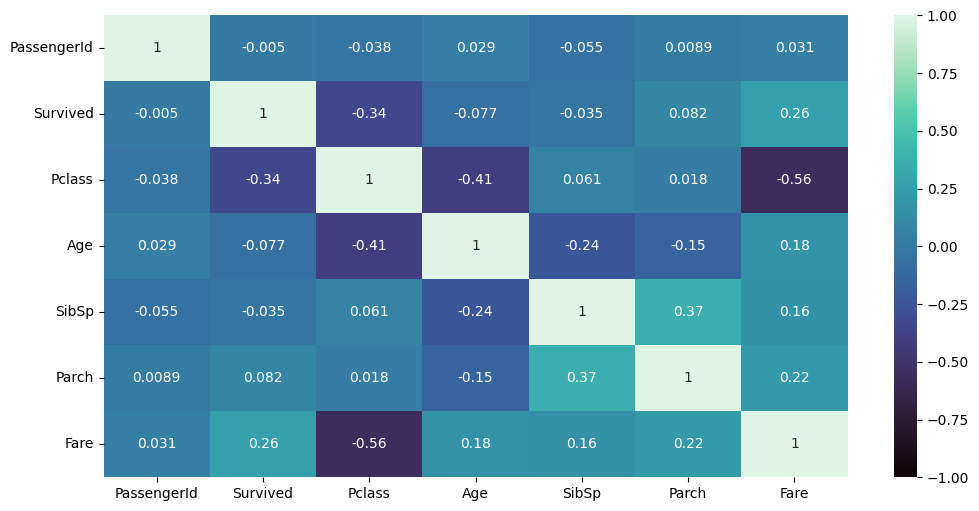

In [ ]:
plt.figure(figsize=(12,6))
corr_matrix = df[numerical_col].corr()
sns.heatmap(corr_matrix, cmap="mako", annot=True, vmin=-1, vmax=1)
plt.show()

In [ ]:
# Make copy df
df_copy = df.copy()

# Substitute values to check the distribution of test data
if 0:
  for col_name, item in df_copy.iteritems():
    df_copy[col_name] = df_copy[col_name].replace(np.nan,"N/A")
else:
  df_copy["Survived"] = df_copy["Survived"].replace(np.nan,"N/A")

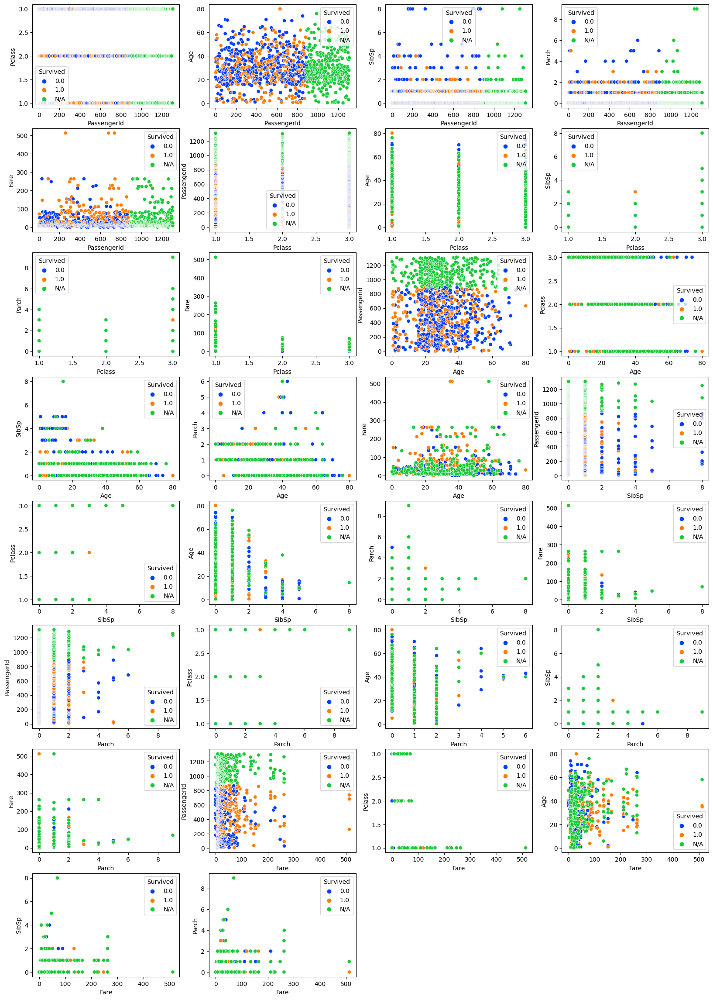

In [ ]:
# ScatterPlot
def eda_numeric_data(df):
  columns_num = len(numerical_col)
  rows_num = int(np.ceil((len(numerical_col)**2-len(numerical_col))/4))
  label_num = 1
  n = 1

  a = rows_num // 4
  plt.figure(figsize=(20,20*a))
  for i in numerical_col:
    for j in numerical_col:
      if i != j and i != "Survived" and j != "Survived":
        plt.subplot(rows_num,4,n)
        sns.scatterplot(data=df, x=i, y=j, hue="Survived", palette='bright')
        n += 1
  plt.show()

eda_numeric_data(df_copy)

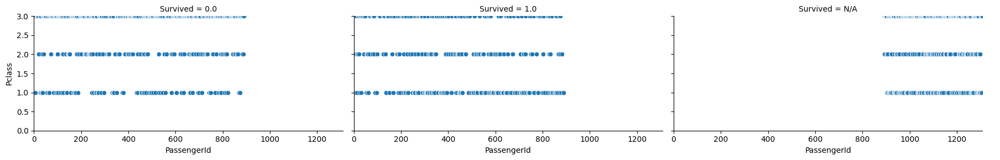

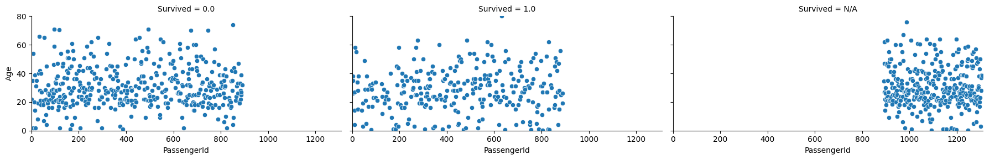

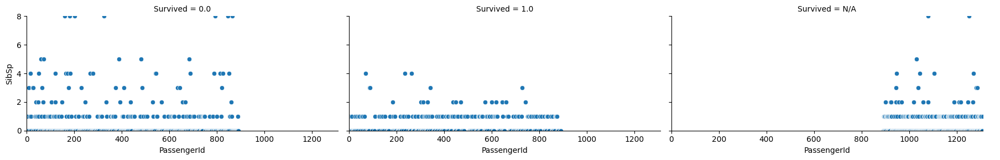

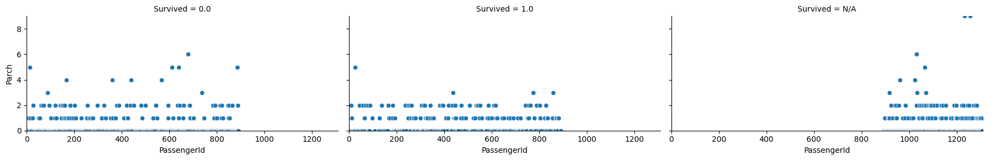

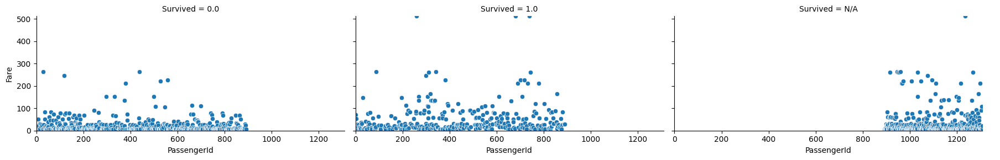

...

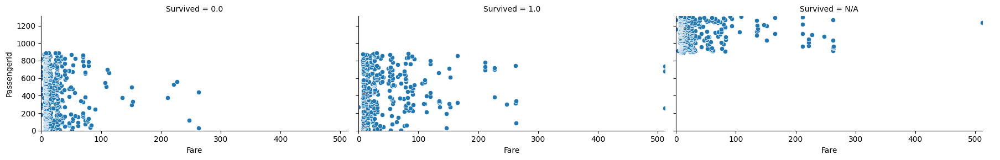

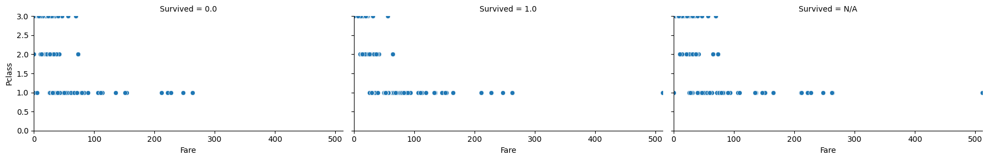

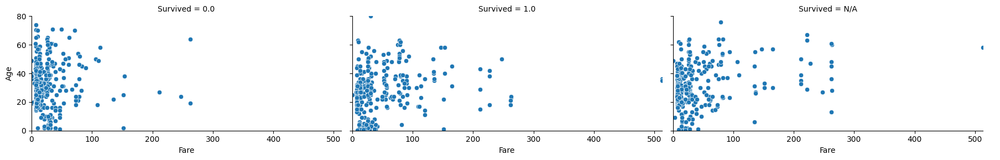

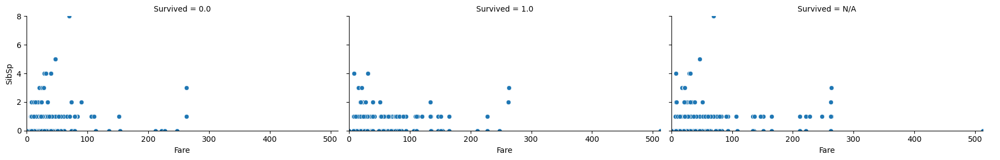

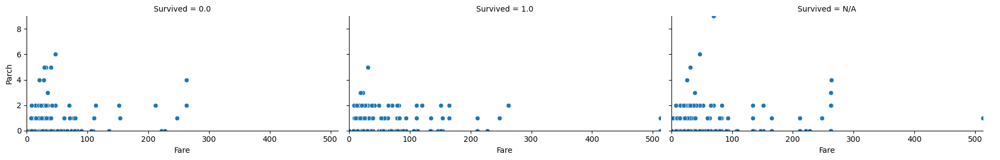

In [ ]:
# ScatterPlot after classification
def eda_numeric_data_after_classificationt(df):
  for i in numerical_col:
    for j in numerical_col:
      if i != j and i != "Survived" and j != "Survived":
        facet = sns.FacetGrid(df, col="Survived",aspect=2)
        facet.map(sns.scatterplot, i, j)
        facet.set(xlim=(0, df.loc[:,i].max()), ylim=(0, df.loc[:,j].max()))
        facet.add_legend()
        plt.show()
eda_numeric_data_after_classificationt(df_copy)

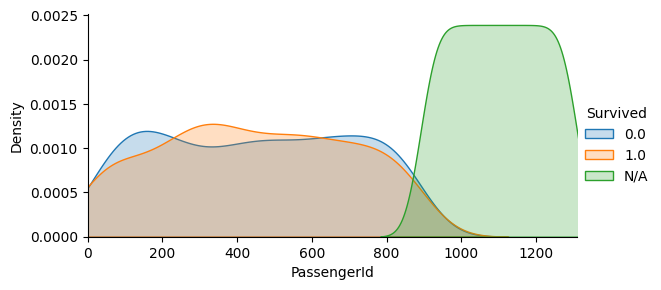

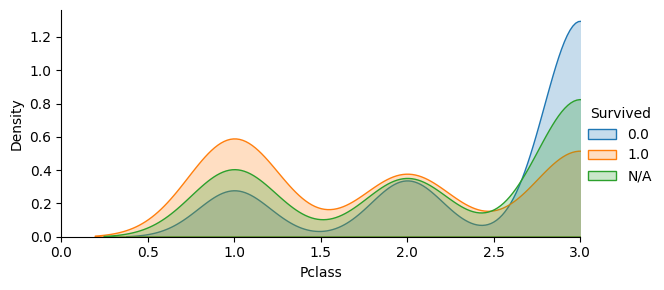

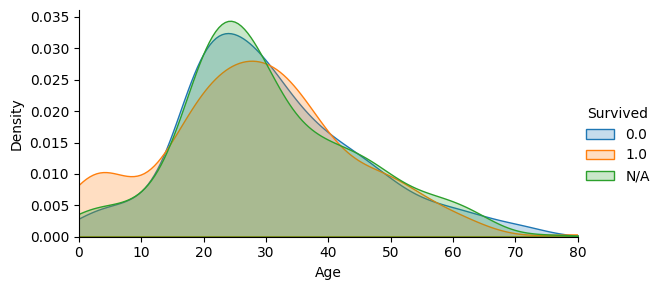

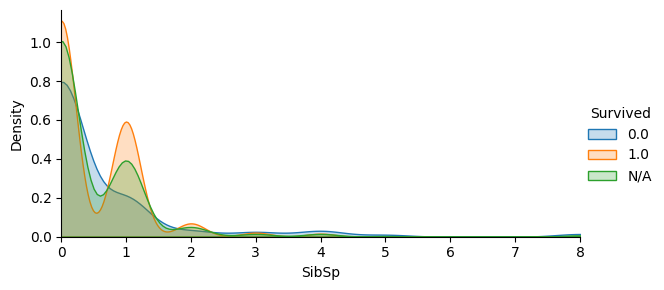

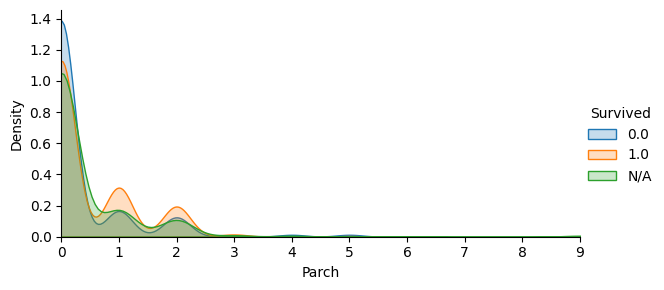

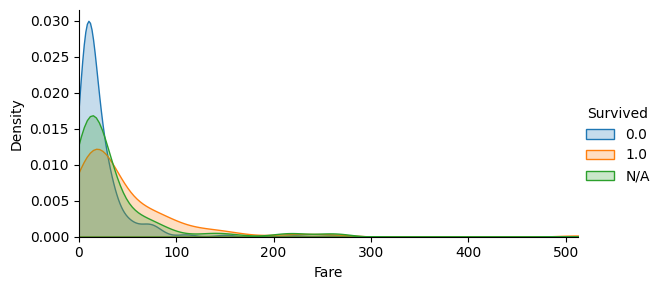

In [ ]:
# Histgram after classification
def eda_numeric_data_hist(df):
  for i in numerical_col:
    if i != "Survived":
      facet = sns.FacetGrid(df, hue="Survived",aspect=2)
      facet.map(sns.kdeplot, i,shade= True)
      facet.set(xlim=(0, df.loc[:,i].max()))
      facet.add_legend()
      plt.show()
eda_numeric_data_hist(df_copy)

### Visualization of Categorical Data

In [ ]:
#Count unique label
###if necessary, perform grouping, to check the distribution of values
for column in df.columns:
    print(f"Processing column {column}:", "Unique label number=",len(df[column].unique()))
    if len(df[column].unique()) < 20:
      print(df[column].unique())

Processing column PassengerId: Unique label number= 1309
Processing column Survived: Unique label number= 3
[ 0.  1. nan]
Processing column Pclass: Unique label number= 3
[3 1 2]
Processing column Name: Unique label number= 1307
Processing column Sex: Unique label number= 2
['male' 'female']
Processing column Age: Unique label number= 99
Processing column SibSp: Unique label number= 7
[1 0 3 4 2 5 8]
Processing column Parch: Unique label number= 8
[0 1 2 5 3 4 6 9]
Processing column Ticket: Unique label number= 929
Processing column Fare: Unique label number= 282
Processing column Cabin: Unique label number= 187
Processing column Embarked: Unique label number= 4
['S' 'C' 'Q' nan]


In [ ]:
#Grouping 1
def groping_ticket(df):
  Ticket_Count = dict(df['Ticket'].value_counts())
  df['TicketGroup'] = df['Ticket'].map(Ticket_Count)

  df.loc[(df['TicketGroup']>=2) & (df['TicketGroup']<=4), 'Ticket_label'] = 2
  df.loc[(df['TicketGroup']>=5) & (df['TicketGroup']<=8) | (df['TicketGroup']==1), 'Ticket_label'] = 1
  df.loc[(df['TicketGroup']>=11), 'Ticket_label'] = 0
  return df

df_copy = groping_ticket(df_copy)
df = groping_ticket(df)
not_numerical_col.append("Ticket_label")

In [ ]:
#Grouping 2
def groping_cabin(df):
  df['Cabin'] = df['Cabin'].fillna('Unknown')
  df['Cabin_label']=df['Cabin'].str.get(0)
  return df
df_copy = groping_cabin(df_copy)
df = groping_cabin(df)
not_numerical_col.append("Cabin_label")

In [ ]:
#Grouping 3
def groping_name(df):
  df['Title'] = df['Name'].map(lambda x: x.split(', ')[1].split('. ')[0])
  df['Title'].replace(['Capt', 'Col', 'Major', 'Dr', 'Rev'], 'Officer', inplace=True)
  df['Title'].replace(['Don', 'Sir',  'the Countess', 'Lady', 'Dona'], 'Royalty', inplace=True)
  df['Title'].replace(['Mme', 'Ms'], 'Mrs', inplace=True)
  df['Title'].replace(['Mlle'], 'Miss', inplace=True)
  df['Title'].replace(['Jonkheer'], 'Master', inplace=True)
  return df
df_copy = groping_name(df_copy)
df = groping_name(df)
not_numerical_col.append('Title')

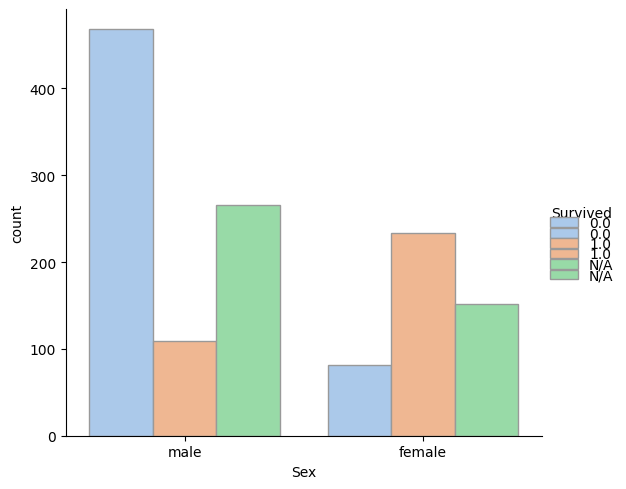

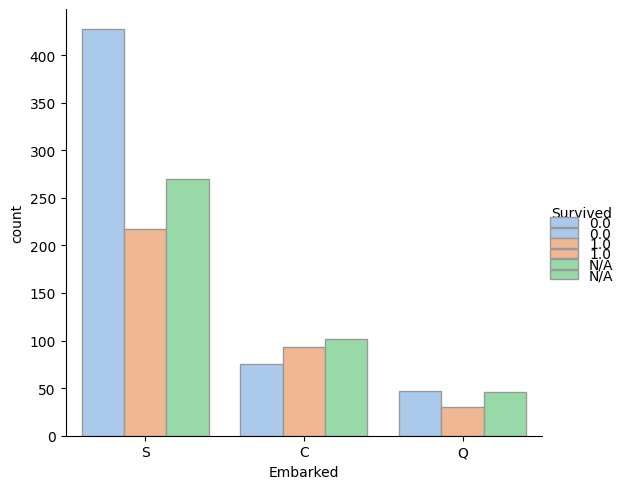

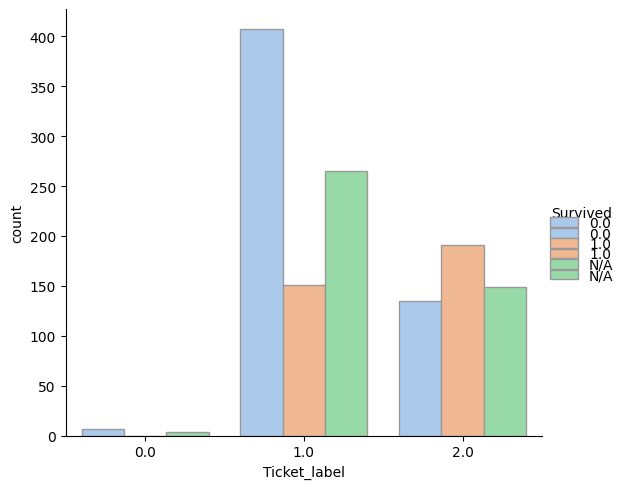

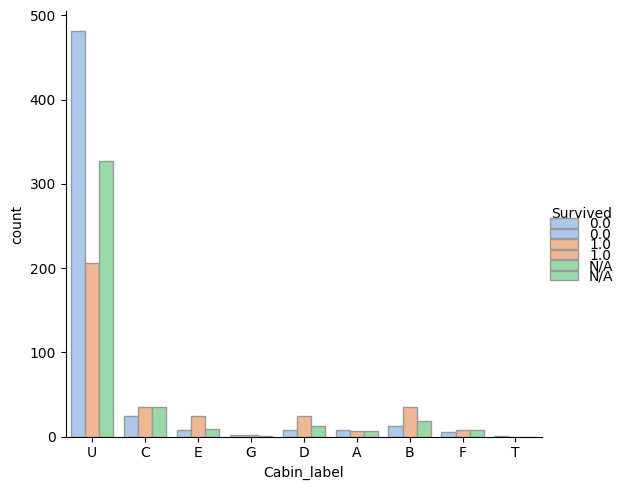

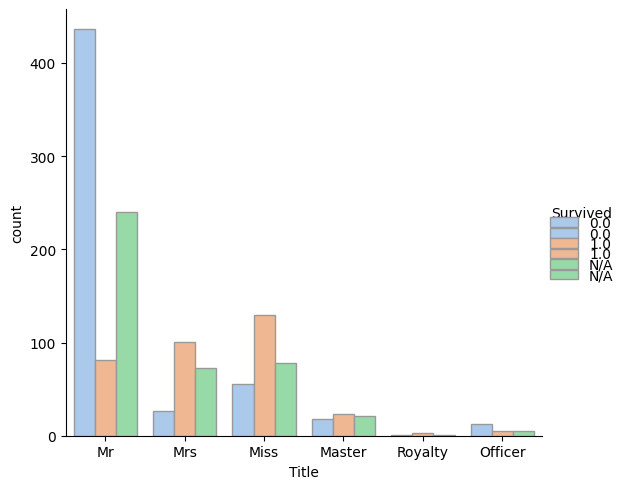

In [ ]:
# Histgram after classification
def eda_categorical_data_hist(df):
  for i in not_numerical_col:
    if i != "Survived":
      if len(df[i].unique()) < 20:
        cat = sns.catplot(
        data=df, x=i, hue="Survived", kind="count",
        palette="pastel", edgecolor=".6",
        )
        cat.add_legend()
        plt.show()
eda_categorical_data_hist(df_copy)

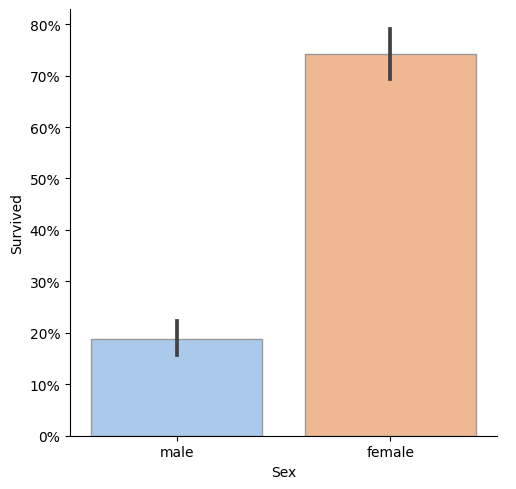

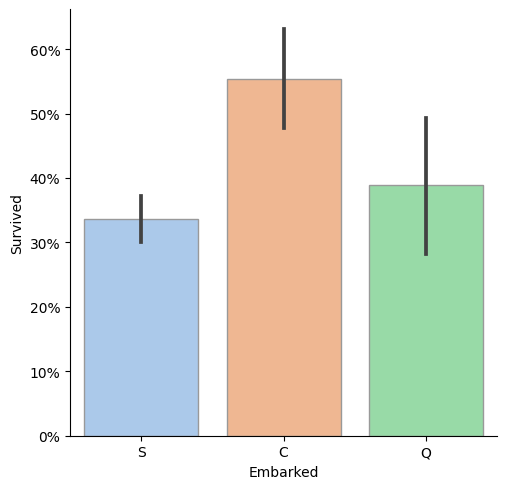

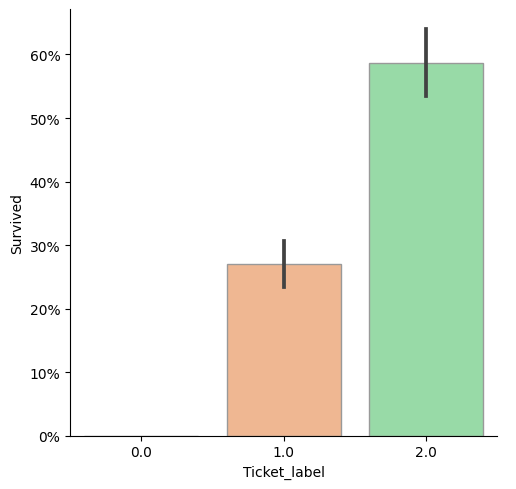

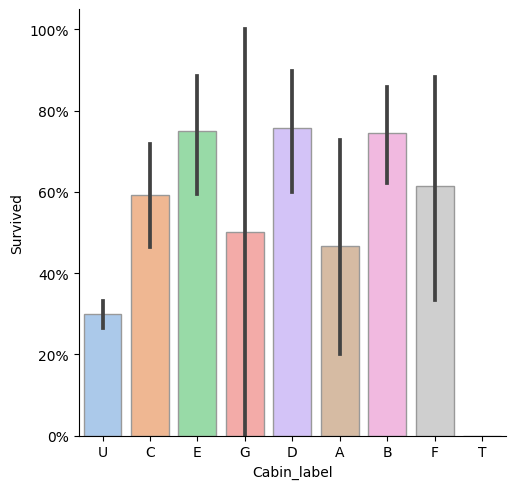

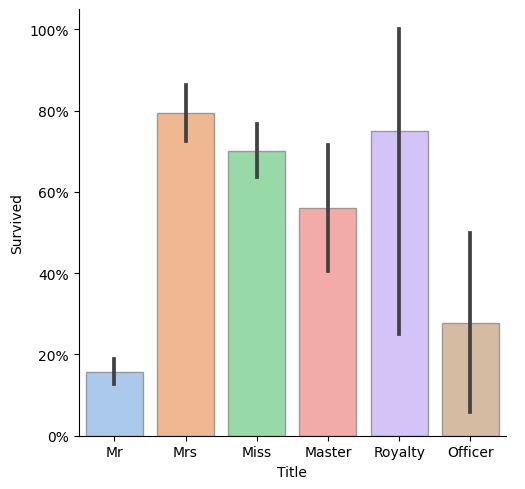

In [ ]:
# Histgram after classification(percentage)
def eda_categorical_data_per(df):
  for i in not_numerical_col:
    if i != "Survived":
      if len(df[i].unique()) < 20:
        cat = sns.catplot(
        data=df, x=i, y="Survived", kind="bar",
        palette="pastel", edgecolor=".6",
        )
        cat.add_legend()
        for ax in cat.axes.flat:
          ax.yaxis.set_major_formatter(PercentFormatter(1))
        plt.show()
eda_categorical_data_per(df)

## **Preprocessing**

In [ ]:
#Summary
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   1309 non-null   int64  
 1   Survived      891 non-null    float64
 2   Pclass        1309 non-null   int64  
 3   Name          1309 non-null   object 
 4   Sex           1309 non-null   object 
 5   Age           1046 non-null   float64
 6   SibSp         1309 non-null   int64  
 7   Parch         1309 non-null   int64  
 8   Ticket        1309 non-null   object 
 9   Fare          1308 non-null   float64
 10  Cabin         1309 non-null   object 
 11  Embarked      1307 non-null   object 
 12  TicketGroup   1309 non-null   int64  
 13  Ticket_label  1309 non-null   float64
 14  Cabin_label   1309 non-null   object 
 15  Title         1309 non-null   object 
dtypes: float64(4), int64(5), object(7)
memory usage: 163.8+ KB


In [ ]:
#Count Nan
df.isnull().sum()

PassengerId       0
Survived        418
Pclass            0
Name              0
Sex               0
Age             263
SibSp             0
Parch             0
Ticket            0
Fare              1
Cabin             0
Embarked          2
TicketGroup       0
Ticket_label      0
Cabin_label       0
Title             0
dtype: int64

In [ ]:
df['Embarked'].fillna('S',inplace=True)
df['Age'].fillna(df['Age'].median(),inplace=True)
df['Cabin'].fillna(df['Cabin'].ffill().bfill(),inplace=True)

In [ ]:
#statistic value
df.describe(include="O").style.background_gradient(cmap='Blues')

,Name,Sex,Ticket,Cabin,Embarked,Cabin_label,Title
count,1309,1309,1309,1309,1309,1309,1309
unique,1307,2,929,187,3,9,6
top,"Connolly, Miss. Kate",male,CA. 2343,Unknown,S,U,Mr
freq,2,843,11,1014,916,1014,757


In [ ]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
df['Sex']=le.fit_transform(df['Sex'])
df['Ticket']=le.fit_transform(df['Ticket'])
df['Cabin']=le.fit_transform(df['Cabin'])
df['Embarked']=le.fit_transform(df['Embarked'])

df["Age_group"] = 0
df.loc[df['Age']<=12,'Age_group']=1
df.loc[df['Age']<=30,'Age_group']=2
df.loc[df['Age']<=40,'Age_group']=3
df.loc[df['Age']>40,'Age_group']=4

In [ ]:
# Filter
df_fl = df.copy()
df_fl=df_fl[['PassengerId', 'Survived','Pclass','Sex','Age','SibSp','Parch','Cabin','Embarked']]
df_fl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Survived     891 non-null    float64
 2   Pclass       1309 non-null   int64  
 3   Sex          1309 non-null   int64  
 4   Age          1309 non-null   float64
 5   SibSp        1309 non-null   int64  
 6   Parch        1309 non-null   int64  
 7   Cabin        1309 non-null   int64  
 8   Embarked     1309 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 92.2 KB


## **Model development**

In [ ]:
# Data Processing
train = df_fl[df_fl['Survived'].notnull()]
test_raw = df_fl[df_fl['Survived'].isnull()].drop('Survived',axis=1)
test = test_raw.drop('PassengerId', axis=1)
X = train.drop(['Survived', 'PassengerId'], axis=1)
y = train['Survived']

In [ ]:
# Standard Scaler
scaler = StandardScaler()
scaler.fit(X)
X = pd.DataFrame(scaler.transform(X), columns=X.columns)
test = pd.DataFrame(scaler.transform(test), columns=test.columns)

In [ ]:
# Split data set(Not K fold)
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.02, random_state=42)

In [ ]:
def loss_fn(y_true, y_pred):
    return tfp.stats.percentile(tf.abs(y_true - y_pred), q=50)

def metric_fn(y_true, y_pred):
    return tfp.stats.percentile(tf.abs(y_true - y_pred), q=100) - tfp.stats.percentile(tf.abs(y_true - y_pred), q=0)

In [ ]:
callbacks_list = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30, verbose=2, mode='min', restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=3, min_lr=0.00001),
    tf.keras.callbacks.TerminateOnNaN()
]

In [ ]:
!pwd
%load_ext tensorboard
!rm -rf ./logs/

/content


In [ ]:
import datetime
def create_model():
  input_layer = tf.keras.Input(shape=(len(X.columns),))
  z = tf.keras.layers.BatchNormalization(epsilon=0.00001)(input_layer)
  z = tf.keras.layers.Dense(16, activation='relu')(z)
  z = tf.keras.layers.Dense(32, activation='relu')(z)
  z = tf.keras.layers.Dense(32, activation='sigmoid')(z)
  output_layer = tf.keras.layers.Dense(1)(z)

  model = tf.keras.Model(inputs=input_layer, outputs=output_layer)

  model.compile(optimizer=tf.keras.optimizers.Adam(0.013, beta_1=0.5),
                loss=loss_fn,
                metrics=[metric_fn])

  return model

log_dir = "logs/fit/" + datetime.datetime.now(pytz.timezone('Asia/Tokyo')).strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
model = create_model()
keras_model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=32, verbose=0, callbacks=[tensorboard_callback],)

# training
if 1:
  scores = []
  for train, valid in kfold.split(X, y):
    X_train, X_valid, y_train, y_valid = X.iloc[train], X.iloc[valid], y.iloc[train], y.iloc[valid]
    keras_model.fit(X_train, y_train)

    # evaluate
    y_pred = keras_model.predict(X_valid)
    accuracy = accuracy_score(y_valid, y_pred.round())
    scores.append(accuracy)
  for i, score in enumerate(scores, 1):
      print(f'Fold {i}: Accuracy = {score:.4f}')
else:
  model.fit(X.astype('float32'), y.astype('float32'),
                    epochs=100,
#                     class_weight=model_lgb.class_weight,
#                    callbacks=callbacks_list,,
          callbacks=[tensorboard_callback],
                    validation_split=0.1)


Fold 1: Accuracy = 0.7821
Fold 2: Accuracy = 0.7809
Fold 3: Accuracy = 0.7697
Fold 4: Accuracy = 0.7584
Fold 5: Accuracy = 0.7416


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 7)]               0         
                                                                 
 batch_normalization (Batch  (None, 7)                 28        
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 16)                128       
                                                                 
 dense_1 (Dense)             (None, 32)                544       
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                             

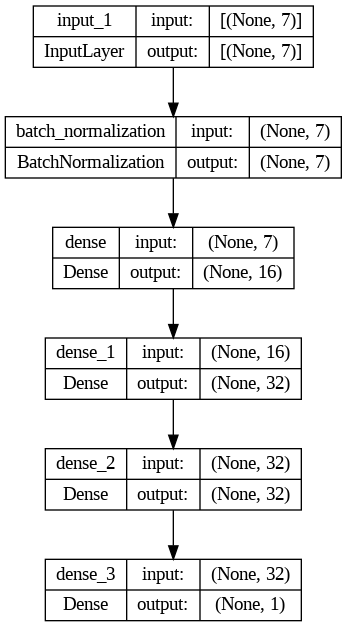

In [ ]:
model.summary()
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True)

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
test_pred = keras_model.predict(test)#.astype('int32')
test_pred = test_pred.round().astype('int32')

## **Feature analysis**

In [ ]:
# Feature Gradients
# tf.data.Datasetを使ってデータのバッチを生成
batch_size = 10
dataset = tf.data.Dataset.from_tensor_slices(X).batch(batch_size)

# make iterator
iterator = iter(dataset)
X_batch = iterator.get_next()

model_gi = create_model()
# Gradients Importance
with tf.GradientTape() as tape:
    predictions = model_gi(X_batch)
    loss = tf.reduce_mean(predictions)

# calc gradient
gradients = tape.gradient(loss, model_gi.trainable_variables)
feature_gradients = [(feature_name, tf.reduce_mean(tf.abs(grad)).numpy()) for feature_name, grad in zip(X.columns, gradients)]
for feature_name, absolute_grad in feature_gradients:
    print(f'Feature {feature_name}: {absolute_grad}')

Feature Pclass: 0.009435422718524933
Feature Sex: 0.009614622220396996
Feature Age: 0.007893712259829044
Feature SibSp: 0.015745915472507477
Feature Parch: 0.0062565733678638935
Feature Cabin: 0.021653153002262115
Feature Embarked: 0.007908189669251442


shap.Explainer is directly supported for Scikit-learn models and Keras models, but cannot be directly applied to Scikit-learn wrapper models such as KerasClassifier, so build the model separately

In [ ]:
# SHAP
explainer = shap.KernelExplainer(model=keras_model.predict, data=shap.sample(X.astype('float32'), 1))
shap_values = explainer.shap_values(X.astype('float32'))
shap.summary_plot(shap_values, X)

  0%|          | 0/891 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

## **Submit**

In [ ]:
submission = pd.DataFrame()
submission['PassengerId'] = test_raw['PassengerId']
submission['Survived'] = test_pred

submission.to_csv("submission.csv", encoding='utf-8', index=False)

In [ ]:
submission

,PassengerId,Survived
891,892,0
892,893,1
893,894,0
894,895,0
895,896,0
...,...,...
1304,1305,0
1305,1306,1
1306,1307,0
1307,1308,0
